In [1]:
import healpy as hp
import numpy as np
import matplotlib.pyplot as plt
from glob import glob
import os

In [2]:
# Directory for map storage
map_prefix = '/data/user/fmcnally/icetop_12yr/maps/temp'

In [3]:
# Save in summary files
for year in range(2011,2022):
    map_list = sorted(glob(f'{map_prefix}/IT81-{year}/*.fits'))
    tiered_maps = [sorted([m for m in map_list if f'Tier{i}' in m]) for i in range(1,5)]

    for i, tier in enumerate(tiered_maps):

        if tier == []:
            continue

        outfile = f'{map_prefix}/merged/IT81-{year}_sid_Tier{i+1}.fits'
        if os.path.isfile(outfile):
            continue

        print(f'Working on Tier {i+1} ({year})...')
        
        map_data = np.zeros(shape=(3, hp.nside2npix(64)), dtype=float)
        for m in tier:
            map_data += hp.read_map(m, range(3), verbose=False)
            
        print(f'  Combined map written to {outfile}')
        hp.write_map(outfile, map_data)

In [4]:
# Combine summary files too
map_list = sorted(glob(f'{map_prefix}/merged/IT81-????_*.fits'))
tiered_maps = [sorted([m for m in map_list if f'Tier{i}' in m]) for i in range(1,5)]

for i, tier in enumerate(tiered_maps):
    
    print(f'Working on Tier {i+1} (combined)...')

    outfile = f'{map_prefix}/merged/IT81_sid_Tier{i+1}.fits'
    if os.path.isfile(outfile):
        os.remove(outfile)
    
    map_data = np.zeros(shape=(3, hp.nside2npix(64)), dtype=float)
    for m in tier:
        map_data += hp.read_map(m, range(3), verbose=False)
        
    print(f'  Combined map written to {outfile}')
    hp.write_map(outfile, map_data)

Working on Tier 1 (combined)...
  Combined map written to /data/user/fmcnally/icetop_12yr/maps/temp/merged/IT81_sid_Tier1.fits
Working on Tier 2 (combined)...
  Combined map written to /data/user/fmcnally/icetop_12yr/maps/temp/merged/IT81_sid_Tier2.fits
Working on Tier 3 (combined)...
  Combined map written to /data/user/fmcnally/icetop_12yr/maps/temp/merged/IT81_sid_Tier3.fits
Working on Tier 4 (combined)...
  Combined map written to /data/user/fmcnally/icetop_12yr/maps/temp/merged/IT81_sid_Tier4.fits


## Functions for Plotting

In [5]:
""" Mask a map based on a minimum and maximum declination """
def maskMap(unmasked_map, dec_min, dec_max):

    n_pix  = len(unmasked_map)
    n_side = hp.npix2nside(n_pix)
    theta, phi = hp.pix2ang(n_side, range(n_pix))

    theta_min = (90 - dec_min) * np.pi/180
    theta_max = (90 - dec_max) * np.pi/180
    theta_cut = (theta <= theta_min) * (theta >= theta_max)

    masked_map = np.copy(unmasked_map)
    masked_map[np.logical_not(theta_cut)] = hp.UNSEEN

    return masked_map

In [6]:
""" 'Top hat' smoothing over a given angle in degrees """
def smoothMap(m, smoothing_angle_deg):

    npix  = len(m)
    nside = hp.npix2nside(npix)
    smoothing_angle_rad = smoothing_angle_deg * np.pi/180.
    smoothed_map = np.zeros(npix)

    # Set any masked pixel values to zero
    m[m==hp.UNSEEN] = 0

    vec = np.transpose(hp.pix2vec(nside, np.arange(npix)))
    for i in range(npix):
        neighbors = hp.query_disc(nside, vec[i], smoothing_angle_rad)
        smoothed_map[i] += m[neighbors].sum()

    return smoothed_map

In [7]:
""" Li & Ma Significance """
def LMSignificance(n_data, n_bg):

    # For every event, we generate 20 time-scrambled events for the reference map.
    # Alpha is the ratio of the two sets of events
    alpha = 1/20.
    
    n_on  = n_data
    n_off = n_bg / alpha

    sigma = np.sign(n_data - n_bg) * np.sqrt(2*(n_on*np.log(((1+alpha)*n_on) / (alpha*(n_on+n_off)))
        + n_off * np.log(((1+alpha)*n_off) / (n_on+n_off))))

    return sigma

In [8]:
""" Takes a file consisting of data, bg, and local maps. Returns desired final type (relint, sig, etc) 
with smoothing, masking, and fitting options applied """
def getMap(map_file, map_name, smoothing_angle=0, dec_min=-90., dec_max=-35., reorder=False):

    # Read in input file
    data, bg, local = hp.read_map(map_file, range(3), verbose=False)

    # Optionally match Loyola behavior of masking before smoothing
    if reorder:
        data = maskMap(data, dec_min, dec_max)
        bg = maskMap(bg, dec_min, dec_max)
    
    # Option for top-hat smoothing radius
    if smoothing_angle != 0:
        data = smoothMap(data, smoothing_angle)
        bg = smoothMap(bg, smoothing_angle)

    # Return desired map type
    if map_name == 'data':
        output_map = data
    elif map_name == 'bg':
        output_map = bg
    elif map_name == 'sig':
        with np.errstate(divide='ignore'):
            output_map = LMSignificance(data, bg)
    elif map_name == 'relint':
        # Fancy divide statement suppresses divide-by-zero warnings
        output_map = np.divide((data-bg), bg, out=np.zeros_like(data-bg), where=bg!=0)

    # Eliminate NaNs and mask
    output_map[np.isnan(output_map)] = 0
    output_map = maskMap(output_map, dec_min, dec_max)

    return output_map

## Map Testing

### Individual Years

In [11]:
annual_maps = sorted(glob(f'{map_prefix}/merged/IT81-????_*.fits'))
annual_maps = [[m for m in annual_maps if f'Tier{i}' in m] for i in range(1,5)]
n_maps = np.max([len(tier) for tier in annual_maps])

mParams = {'rot':180, 'cmap':'jet'}

In [12]:
for i, tier in enumerate(annual_maps):
    for j, m in enumerate(tier):
        data = hp.read_map(m, verbose=False)
        print(f'Tier {i+1} ({2011+j}): {data.sum()}')

Tier 1 (2011): 25736514.0
Tier 1 (2012): 11912909.0
Tier 1 (2013): 10335767.0
Tier 1 (2014): 9136838.0
Tier 2 (2011): 19279492.0
Tier 2 (2012): 8268829.0
Tier 2 (2013): 7113211.0
Tier 2 (2014): 5579237.0
Tier 3 (2011): 2578848.0
Tier 3 (2012): 1622840.0
Tier 3 (2013): 1361949.0
Tier 3 (2014): 1692795.0
Tier 3 (2015): 1620761.0
Tier 3 (2016): 1863132.0
Tier 3 (2017): 2013218.0
Tier 3 (2018): 2231249.0
Tier 3 (2019): 1718348.0
Tier 3 (2020): 2848601.0
Tier 3 (2021): 2731347.0
Tier 4 (2011): 538344.0
Tier 4 (2012): 289913.0
Tier 4 (2013): 235476.0
Tier 4 (2014): 243121.0
Tier 4 (2015): 227019.0
Tier 4 (2016): 212102.0
Tier 4 (2017): 224960.0
Tier 4 (2018): 191880.0
Tier 4 (2019): 143938.0
Tier 4 (2020): 178075.0
Tier 4 (2021): 168291.0


In [13]:
# Store preprocessed maps for speedup in visualization
map_array = np.zeros(shape=(n_maps, 4, hp.nside2npix(64)))

for i, tier_maps in enumerate(annual_maps):
    for j, m in enumerate(tier_maps):
        map_array[j][i] = getMap(m, 'relint', smoothing_angle=20)

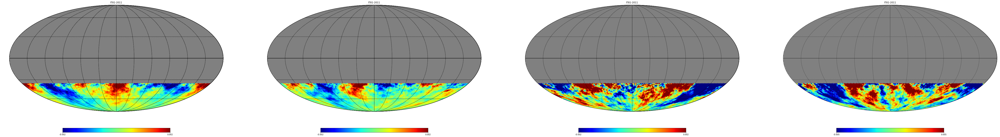

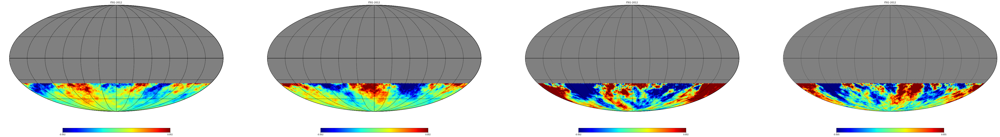

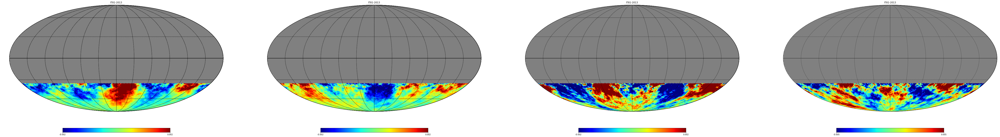

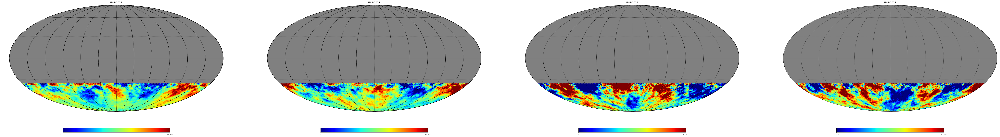

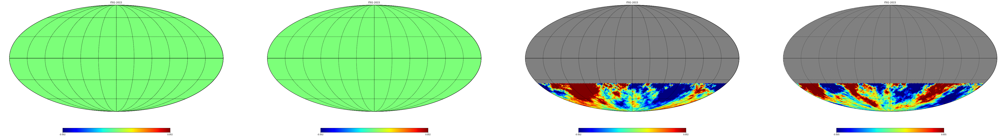

...

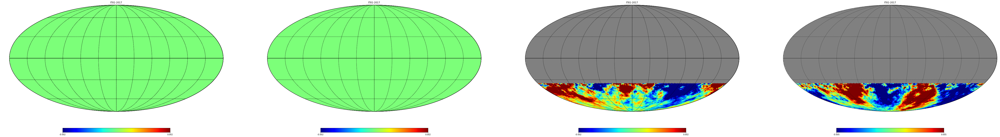

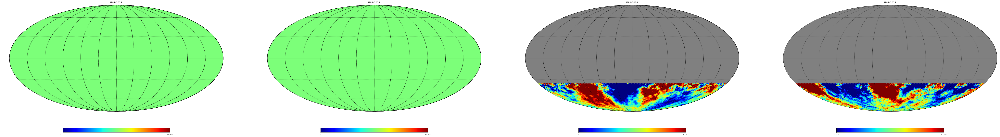

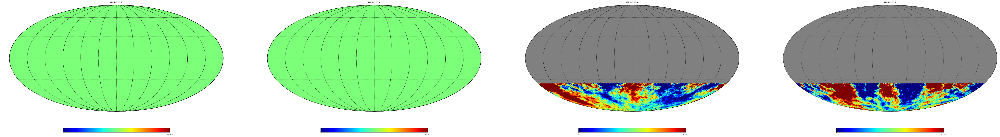

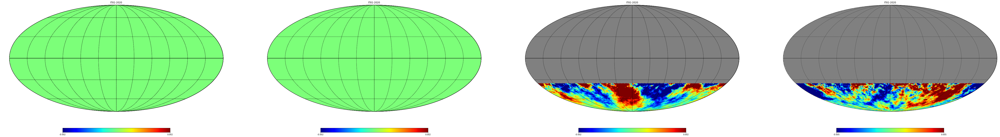

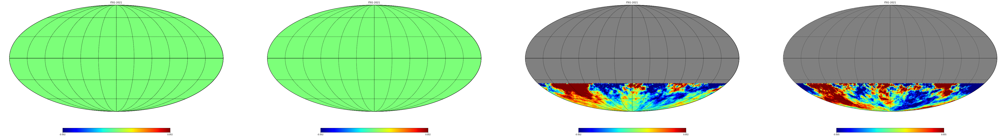

In [21]:
for i in range(n_maps):
    
    fig, axs = plt.subplots(ncols=4, sharex=True, figsize=(90, 30))

    for j, ax in enumerate(axs):
        m_i = map_array[i][j]
        ri_scale = .002 if j < 3 else .005
    
        plt.sca(ax)
        hp.mollview(m_i, title=f'IT81-{2011+i}', min=-ri_scale, max=ri_scale, hold=True, **mParams)
        hp.graticule(verbose=False)
    
    plt.show()

### Cumulative Maps

In [12]:
maps = sorted(glob(f'{map_prefix}/merged/IT81_*.fits'))
n_maps = len(maps)

mParams = {'rot':180, 'cmap':'rainbow'}

In [13]:
# Store preprocessed maps for speedup in visualization
map_array = np.zeros(shape=(n_maps, 2, hp.nside2npix(64)))

for i, m in enumerate(maps):
    for j in range(2):
        map_array[i][j] = getMap(m, 'relint', smoothing_angle=20, reorder=bool(j))

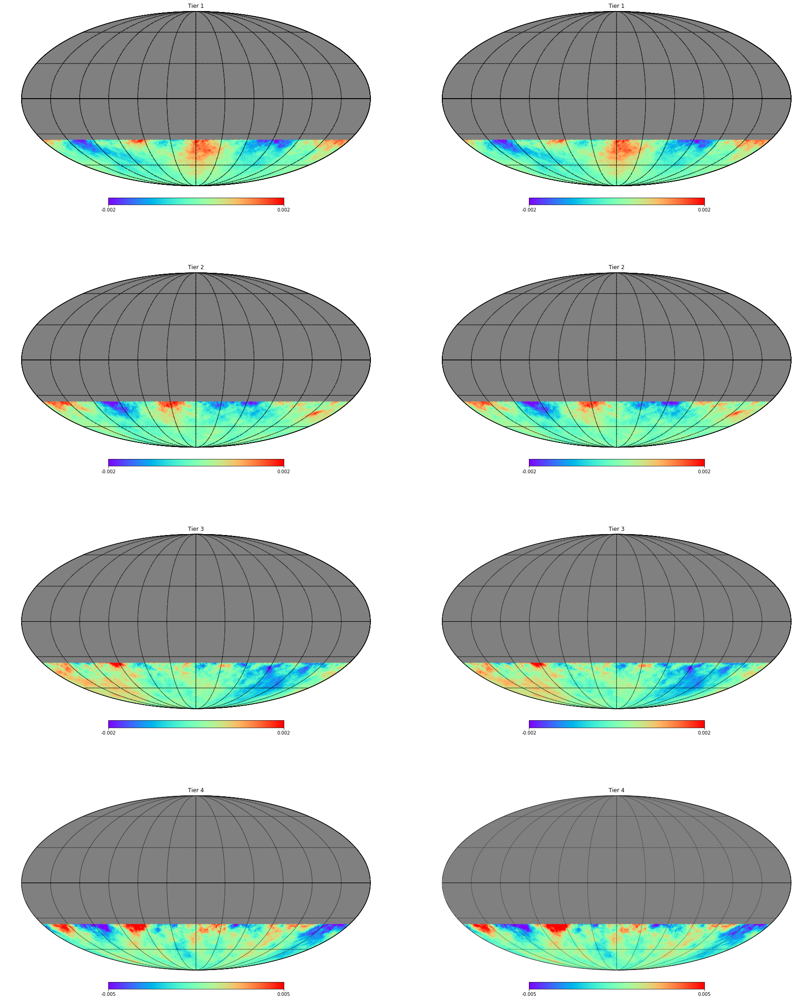

In [14]:
fig, axs = plt.subplots(nrows=n_maps, ncols=2, sharey=True, figsize=(30, 10*len(maps)))

for i, ax_row in enumerate(axs):
    
    for j, ax in enumerate(ax_row):
       
        m_i = map_array[i][j]
        ri_scale = .002 if i < 3 else .005

        plt.sca(ax)
        hp.mollview(m_i, title=f'Tier {i+1}', min=-ri_scale, max=ri_scale, hold=True, **mParams)
        hp.graticule(verbose=False)

plt.show()